# Exploratory Data Analysis(EDA)

In [1]:
!pip install kaleido

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import plotly.graph_objects as go
from sklearn import metrics
import matplotlib.cm as cm
from scipy import stats

import warnings
warnings.filterwarnings('ignore')
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## Dataset 1 - historical_data.csv

### 1. Data Overview

In [3]:
df1 = pd.read_csv("./dataset/historical_data.csv", sep = ';')
df1.shape
df1.head().append(df1.tail())

(100, 27)

,chaine_PS,dep_opti,ref_PS,Etat_PEC,Prix_brute_M,Remise_M,Prix_brute_VD,Remise_VD,Prix_brute_VG,Remise_VG,...,Prix_monture,Prix_verres,Prix_total,remise_verres,remise_montures,remise_total,abs_correction,dep_ophta,lien_dep,age_beneficiaire
0,386a6002b407d5e,92,a0597f6f7c6dbf2,FAC,300,0,120,0,120,0,...,300,240,540,0,0,0,7,75,Limitrophes,48
1,386a6002b407d5e,34,cc915026207811c,FAC,150,0,325,0,325,0,...,150,650,800,0,0,0,0,34,Identique,69
2,386a6002b407d5e,75,a051c65c4b68741,FAC,90,0,140,0,140,0,...,90,280,370,0,0,0,0,75,Identique,28
3,386a6002b407d5e,75,ae1abc30bfffa8a,FAC,40,0,0,0,0,0,...,40,0,40,0,0,0,0,75,Identique,73
4,386a6002b407d5e,13,935f32ba55d1575,FAC,150,0,15,0,15,0,...,150,30,180,0,0,0,0,13,Identique,25
95,386a6002b407d5e,75,fcee64fadc60be9,FAC,150,0,215,0,215,0,...,150,430,580,0,0,0,0,75,Identique,77
96,386a6002b407d5e,78,0f9ebe1a123934d,FAC,150,0,125,0,125,0,...,150,250,400,0,0,0,0,78,Identique,63
97,386a6002b407d5e,34,f0cec8e6ff54f36,FAC,180,0,115,0,115,0,...,180,230,410,0,0,0,0,34,Identique,56
98,386a6002b407d5e,75,fcee64fadc60be9,FAC,180,0,50,0,50,0,...,180,100,280,0,0,0,0,75,Identique,27
99,386a6002b407d5e,77,6d505745ae2618d,ANN,200,0,125,0,125,0,...,200,250,450,0,0,0,0,77,Identique,39


- General statistical analysis

In [4]:
df1.describe()
df1.info()

,dep_opti,Prix_brute_M,Remise_M,Prix_brute_VD,Remise_VD,Prix_brute_VG,Remise_VG,sphere_VD,cylindre_VD,addition_VD,...,addition_VG,Prix_monture,Prix_verres,Prix_total,remise_verres,remise_montures,remise_total,abs_correction,dep_ophta,age_beneficiaire
count,100.000000,100.000000,100.00,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,100.000000,100.000000,100.00000,100.000000,100.000000,100.00,100.000000,100.000000,100.000000,100.000000
mean,50.570000,143.700000,0.15,146.410000,0.280000,146.710000,0.280000,-0.190000,0.120000,0.300000,...,0.300000,143.550000,292.56000,436.110000,0.560000,0.15,0.710000,2.130000,52.270000,47.220000
std,28.473718,82.977117,1.50,95.209296,2.015496,95.363345,2.015496,1.447359,0.383498,0.745356,...,0.745356,82.979172,190.83296,215.125329,4.030991,1.50,4.999586,3.653295,30.384358,18.430092
min,6.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,-6.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,40.000000,0.000000,0.00,0.000000,0.000000,6.000000,3.000000
25%,33.000000,90.000000,0.00,65.000000,0.000000,65.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,90.000000,130.00000,277.500000,0.000000,0.00,0.000000,0.000000,33.000000,34.000000
50%,69.000000,130.000000,0.00,115.000000,0.000000,115.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,130.000000,230.00000,402.000000,0.000000,0.00,0.000000,0.000000,68.000000,48.000000
75%,75.000000,150.000000,0.00,215.000000,0.000000,215.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,150.000000,430.00000,581.500000,0.000000,0.00,0.000000,4.000000,75.000000,63.000000
max,92.000000,450.000000,15.00,400.000000,17.000000,400.000000,17.000000,3.000000,2.000000,3.000000,...,3.000000,450.000000,800.00000,1130.000000,34.000000,15.00,37.000000,21.000000,95.000000,85.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   chaine_PS         100 non-null    object
 1   dep_opti          100 non-null    int64 
 2   ref_PS            100 non-null    object
 3   Etat_PEC          100 non-null    object
 4   Prix_brute_M      100 non-null    int64 
 5   Remise_M          100 non-null    int64 
 6   Prix_brute_VD     100 non-null    int64 
 7   Remise_VD         100 non-null    int64 
 8   Prix_brute_VG     100 non-null    int64 
 9   Remise_VG         100 non-null    int64 
 10  N_prescripteur    100 non-null    object
 11  sphere_VD         100 non-null    int64 
 12  cylindre_VD       100 non-null    int64 
 13  addition_VD       100 non-null    int64 
 14  sphere_VG         100 non-null    int64 
 15  cylindre_VG       100 non-null    int64 
 16  addition_VG       100 non-null    int64 
 17  Prix_monture     

#### Missing value

In [5]:
# Check the number of missing values in each column
print('\nMissing Values:')
df1.isnull().sum()


Missing Values:


chaine_PS           0
dep_opti            0
ref_PS              0
Etat_PEC            0
Prix_brute_M        0
Remise_M            0
Prix_brute_VD       0
Remise_VD           0
Prix_brute_VG       0
Remise_VG           0
N_prescripteur      0
sphere_VD           0
cylindre_VD         0
addition_VD         0
sphere_VG           0
cylindre_VG         0
addition_VG         0
Prix_monture        0
Prix_verres         0
Prix_total          0
remise_verres       0
remise_montures     0
remise_total        0
abs_correction      0
dep_ophta           0
lien_dep            0
age_beneficiaire    0
dtype: int64

In [6]:
df1.quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T

,0.00,0.05,0.50,0.95,0.99,1.00
dep_opti,6.0,6.00,69.0,78.00,92.00,92.0
Prix_brute_M,0.0,70.00,130.0,300.00,450.00,450.0
Remise_M,0.0,0.00,0.0,0.00,0.15,15.0
Prix_brute_VD,0.0,25.00,115.0,325.75,350.50,400.0
Remise_VD,0.0,0.00,0.0,0.00,11.06,17.0
Prix_brute_VG,0.0,25.00,115.0,325.75,350.50,400.0
Remise_VG,0.0,0.00,0.0,0.00,11.06,17.0
sphere_VD,-6.0,-3.05,0.0,2.00,3.00,3.0
cylindre_VD,0.0,0.00,0.0,1.00,2.00,2.0
addition_VD,0.0,0.00,0.0,2.00,3.00,3.0


In [7]:
df1.columns.values

array(['chaine_PS', 'dep_opti', 'ref_PS', 'Etat_PEC', 'Prix_brute_M',
       'Remise_M', 'Prix_brute_VD', 'Remise_VD', 'Prix_brute_VG',
       'Remise_VG', 'N_prescripteur', 'sphere_VD', 'cylindre_VD',
       'addition_VD', 'sphere_VG', 'cylindre_VG', 'addition_VG',
       'Prix_monture', 'Prix_verres', 'Prix_total', 'remise_verres',
       'remise_montures', 'remise_total', 'abs_correction', 'dep_ophta',
       'lien_dep', 'age_beneficiaire'], dtype=object)

### 3. Uni-variate data analysis

#### Distribution Plots

In [8]:
# Get numical columns
int_cols = []
for i in df1.columns:
    if(df1[i].dtype == np.float64 or df1[i].dtype == np.int64):
        int_cols.append(i)


In [9]:
'''
DOUBLE CHECK USEfULNESS
'''
# function to check skewness
def check_skew(df_skew, column):
    skew = stats.skew(df_skew[column])
    skewtest = stats.skewtest(df_skew[column])
    plt.title('Distribution of ' + column)
    sns.distplot(df_skew[column])
    print("{}'s: Skew: {}, : {}".format(column, skew, skewtest))
    return

'\nDOUBLE CHECK USEfULNESS\n'

'\nRECONSIDER THE PLOT: DISTPLOT OR HISTPLOT???\n'

<Figure size 1440x2160 with 0 Axes>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of dep_opti')

<AxesSubplot:title={'center':'Distribution of dep_opti'}, xlabel='dep_opti', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Prix_brute_M')

<AxesSubplot:title={'center':'Distribution of Prix_brute_M'}, xlabel='Prix_brute_M', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Remise_M')

<AxesSubplot:title={'center':'Distribution of Remise_M'}, xlabel='Remise_M', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Prix_brute_VD')

<AxesSubplot:title={'center':'Distribution of Prix_brute_VD'}, xlabel='Prix_brute_VD', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Remise_VD')

<AxesSubplot:title={'center':'Distribution of Remise_VD'}, xlabel='Remise_VD', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Prix_brute_VG')

<AxesSubplot:title={'center':'Distribution of Prix_brute_VG'}, xlabel='Prix_brute_VG', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Remise_VG')

<AxesSubplot:title={'center':'Distribution of Remise_VG'}, xlabel='Remise_VG', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of sphere_VD')

<AxesSubplot:title={'center':'Distribution of sphere_VD'}, xlabel='sphere_VD', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of cylindre_VD')

<AxesSubplot:title={'center':'Distribution of cylindre_VD'}, xlabel='cylindre_VD', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of addition_VD')

<AxesSubplot:title={'center':'Distribution of addition_VD'}, xlabel='addition_VD', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of sphere_VG')

<AxesSubplot:title={'center':'Distribution of sphere_VG'}, xlabel='sphere_VG', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of cylindre_VG')

<AxesSubplot:title={'center':'Distribution of cylindre_VG'}, xlabel='cylindre_VG', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of addition_VG')

<AxesSubplot:title={'center':'Distribution of addition_VG'}, xlabel='addition_VG', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Prix_monture')

<AxesSubplot:title={'center':'Distribution of Prix_monture'}, xlabel='Prix_monture', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Prix_verres')

<AxesSubplot:title={'center':'Distribution of Prix_verres'}, xlabel='Prix_verres', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Prix_total')

<AxesSubplot:title={'center':'Distribution of Prix_total'}, xlabel='Prix_total', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of remise_verres')

<AxesSubplot:title={'center':'Distribution of remise_verres'}, xlabel='remise_verres', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of remise_montures')

<AxesSubplot:title={'center':'Distribution of remise_montures'}, xlabel='remise_montures', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of remise_total')

<AxesSubplot:title={'center':'Distribution of remise_total'}, xlabel='remise_total', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of abs_correction')

<AxesSubplot:title={'center':'Distribution of abs_correction'}, xlabel='abs_correction', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of dep_ophta')

<AxesSubplot:title={'center':'Distribution of dep_ophta'}, xlabel='dep_ophta', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of age_beneficiaire')

<AxesSubplot:title={'center':'Distribution of age_beneficiaire'}, xlabel='age_beneficiaire', ylabel='Density'>

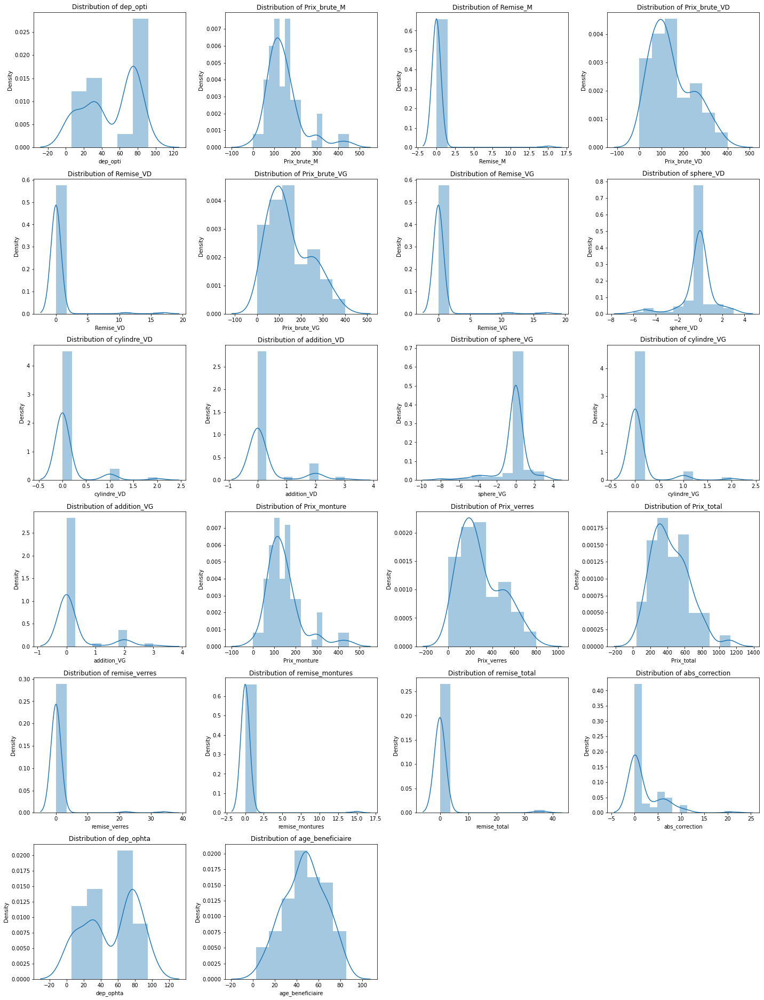

In [36]:
'''
RECONSIDER THE PLOT: DISTPLOT OR HISTPLOT???
'''
# visualize the data distribution 
plt.figure(figsize=(20, 30))

for i in range(len(int_cols)):
    plt.subplot(7, 4, i+1)
    # check_skew(df1, int_cols[i])
    plt.title('Distribution of ' + int_cols[i])
    sns.distplot(df1[int_cols[i]])
    # sns.histplot(df1[int_cols[i]], kde=True, bins=30)

plt.tight_layout()
plt.savefig('plots/data_distribution1.png', bbox_inches='tight')

####  Outliers - Violin Plot

'\n'

{'abs_correction', 'age_beneficiaire'}

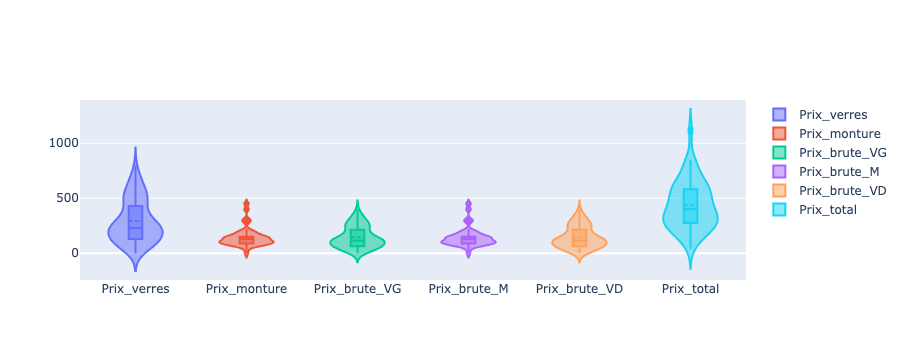

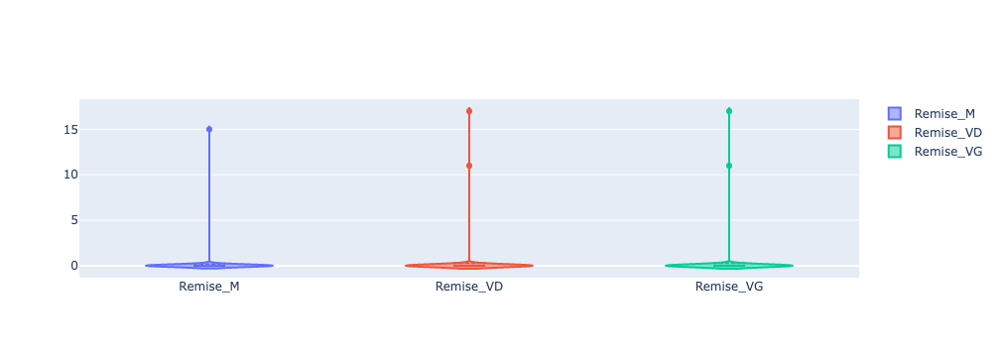

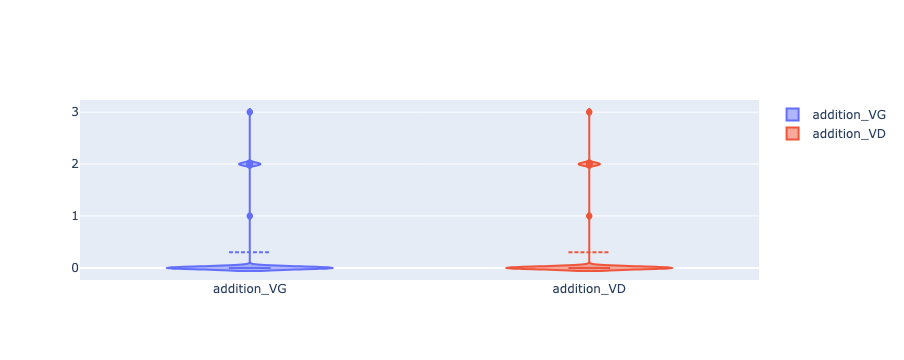

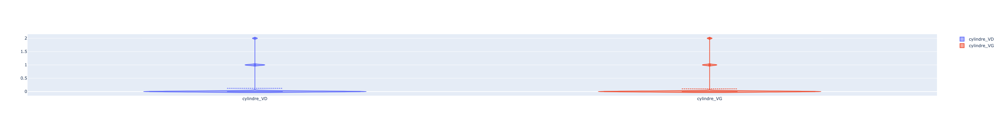

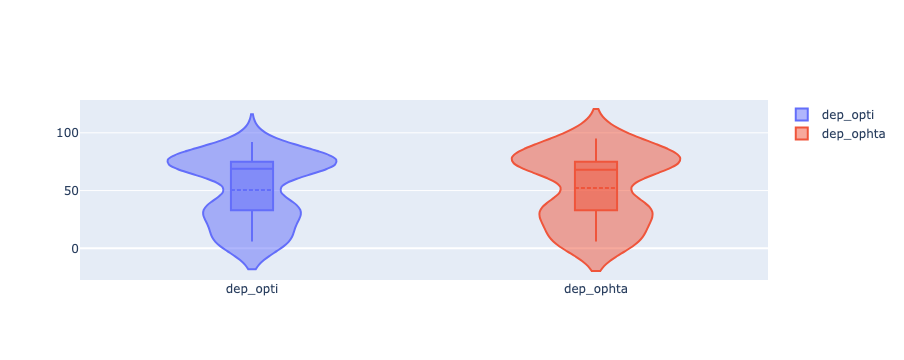

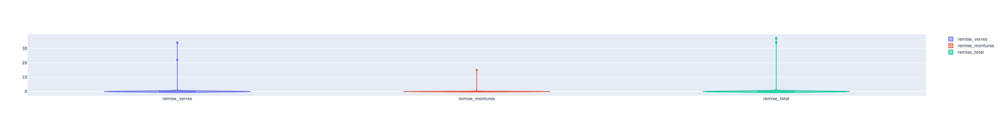

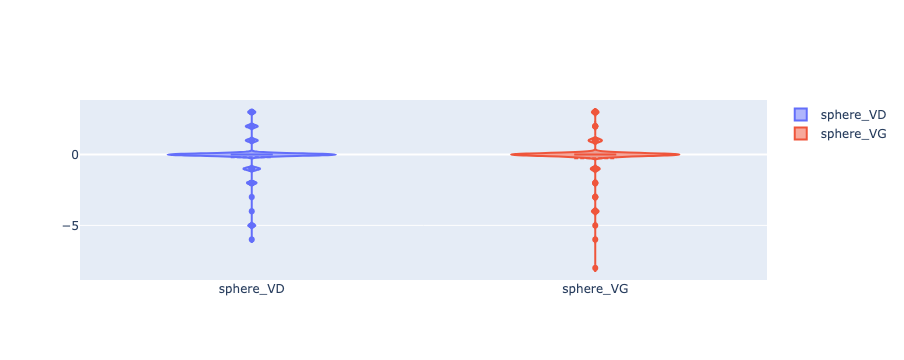

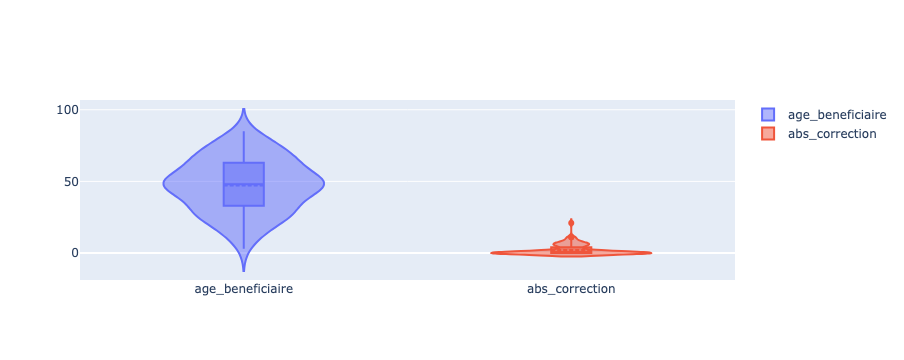

In [11]:
'''
'''
# violin plo† - show outliers
# InteractiveShell.ast_node_interactivity = "last"
import plotly.graph_objects as go

def show_violin(df, cols):
    fig = go.Figure()
    for i in cols:
        fig.add_trace(go.Violin(
            y=df[i],
            name=i,
            box_visible=True,
            meanline_visible=True
        ))
    fig.show()
    return 

    
def find_cols(list_, prefix):
    return set([i for i in list_ if i.startswith(prefix)])
    

# group columns by prefix
Prix_cols = find_cols(int_cols,'Prix')
Remise_cols = find_cols(int_cols,'Remise')
add_cols = find_cols(int_cols,'add')
cylindre_cols = find_cols(int_cols,'cylindre')
dep_cols = find_cols(int_cols,'dep')
remise_cols = find_cols(int_cols,'remise')
sphere_cols = find_cols(int_cols,'sphere')
other_cols = set(int_cols) - Prix_cols - Remise_cols - add_cols - cylindre_cols - dep_cols - remise_cols - sphere_cols
other_cols


# show graphs in group
show_violin(df1, Prix_cols)
show_violin(df1, Remise_cols)
show_violin(df1, add_cols)
show_violin(df1, cylindre_cols)
show_violin(df1, dep_cols)
show_violin(df1, remise_cols)
show_violin(df1, sphere_cols)
show_violin(df1, other_cols)


# print(sorted(int_cols))
# len(int_cols)

### 4. Bi-variate data analysis

#### Pair-plot

'\nCHECK \n'

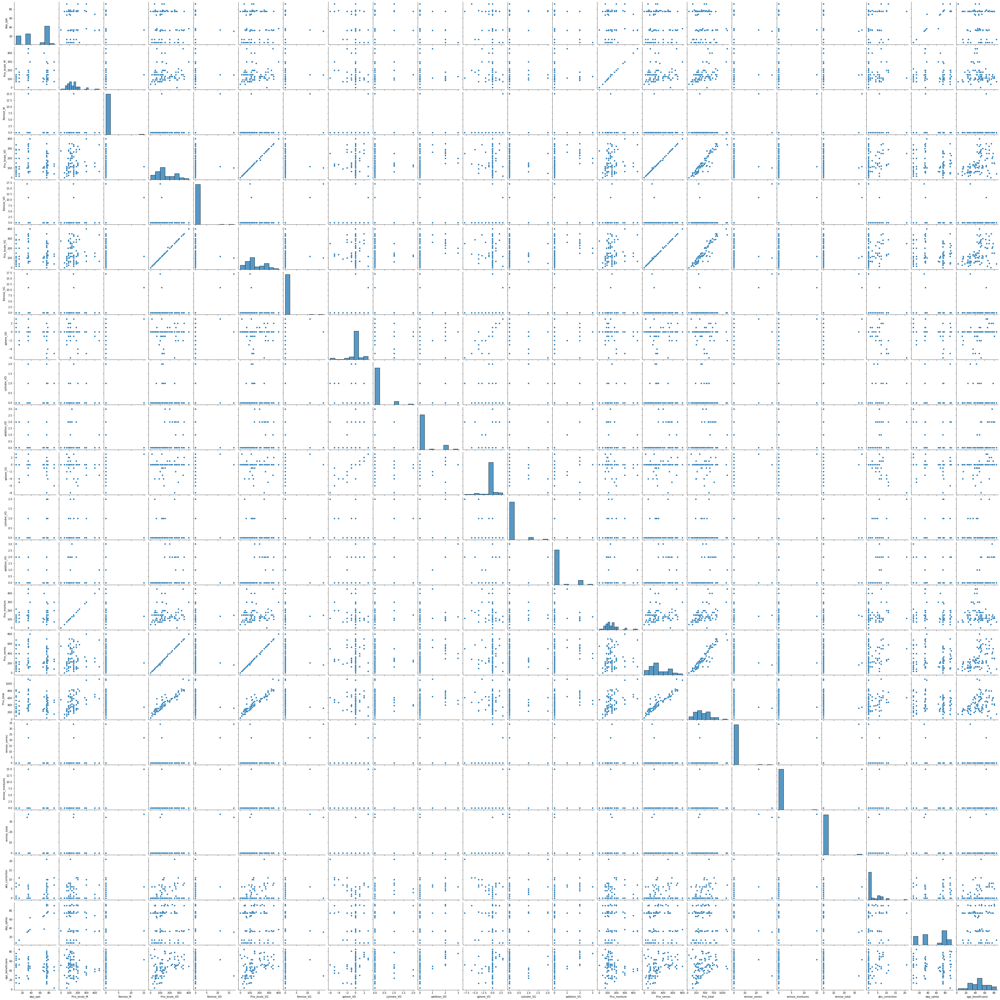

In [12]:
'''
CHECK 
'''
# pairplot 
# pair_cols = ['dep_opti', 'Prix_brute_M', 'Prix_monture', 'Prix_verres', 'Prix_total', 'remise_verres', 'remise_montures', 'remise_total', 'dep_ophta', 'abs_correction', 'age_beneficiaire']
sns.pairplot(df1[int_cols])

# import seaborn as sns

# # Calculate the correlation of all columns with the target variable
# correlation = df1.corr().abs()

# # Select the top N columns with the highest correlation
# top_n_columns = correlation.nlargest(10).index

# # Create pair plot for the selected columns
# sns.pairplot(df1[top_n_columns])


#### Heatmap

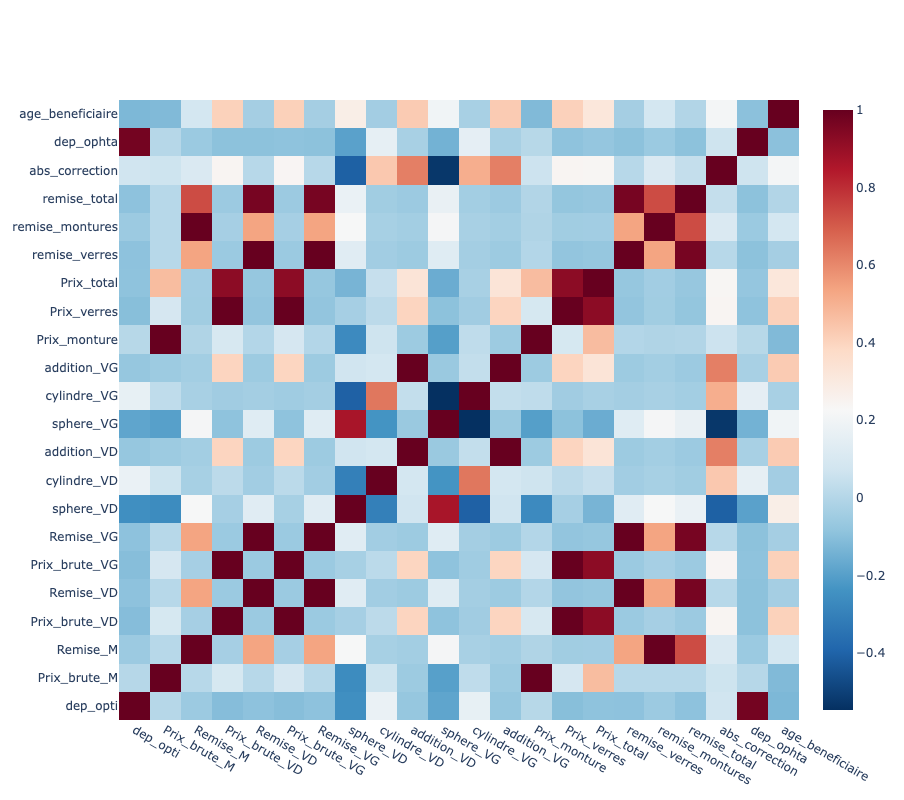

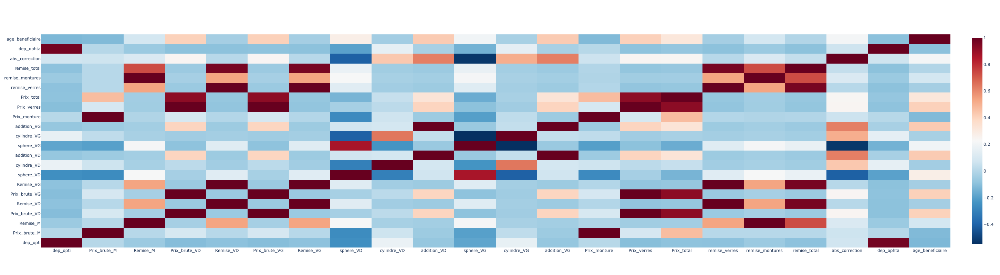

In [41]:
df_corr = df1[int_cols].corr()
fig = go.Figure(data=go.Heatmap(
                z=df_corr.round(3),
                x=int_cols,
                y=int_cols,
                colorscale = 'RdBu_r',
))

fig.update_layout(
    autosize=False,
    width=1000,  # Set the width
    height=800,  # Set the height
)

fig.show()
fig.write_image("plots/heatmap1.png")

### 5. Multivariate analysis with Contour plot


'\n\n'

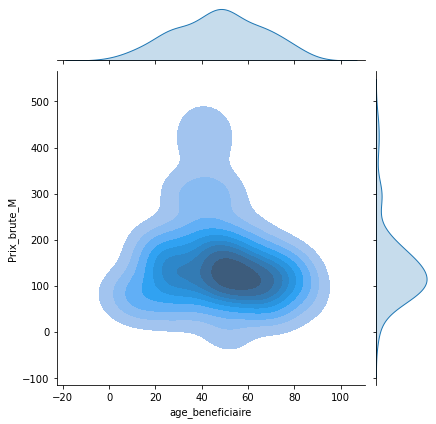

In [14]:
'''

'''
g = sns.jointplot(x = 'age_beneficiaire',  y = 'Prix_brute_M' , data = df1,  kind = 'kde', fill = True)
plt.show()

g.fig.savefig('plots/contour1.png')


## Dataset 2 - optical_care_transaction_opticiens.csv

### 1. Data Overview

In [15]:
InteractiveShell.ast_node_interactivity = "all"
df2 = pd.read_csv("dataset/optical_care_transaction_opticiens.csv", sep = ';')
df2.shape
# df.head().append(df.tail())
pd.concat([df2.head(), df2.tail()])

(12616, 27)

,ref_PS,nb_lignes_PEC,dep_identique,dep_limit,dep_non_limit,PEC_CRE,PEC_ANN,PEC_ACC,PEC_FAC,PEC_REF,...,cor_sphere_VD,cor_cylindre_VD,cor_addition_VD,cor_sphere_VG,cor_cylindre_VG,cor_addition_VG,facteur_correction,age_moyen,nb_prescripteurs,nb_PEC_par_prescripteurs
0,8c47fdd7c69650b,53,96.23,1.89,1.89,30.19,3.77,0.00,62.26,3.77,...,-0.188679,0.056604,0.226415,-0.301887,0.056604,0.226415,1.056604,45.396226,24,2.21
1,89bf4429f3ebda1,31,100.00,0.00,0.00,19.35,22.58,0.00,51.61,6.45,...,0.129032,0.000000,0.129032,0.000000,0.096774,0.193548,0.548387,49.096774,11,2.82
2,5076215e2ee1797,22,95.45,4.55,0.00,4.55,13.64,13.64,68.18,0.00,...,-0.227273,0.318182,0.181818,-0.272727,0.227273,0.181818,2.318182,34.863636,11,2.00
3,3a771e3f5cbc3b2,41,97.56,0.00,2.44,12.20,0.00,4.88,82.93,0.00,...,-0.024390,0.000000,0.048780,0.000000,0.000000,0.048780,0.365854,31.829268,8,5.12
4,ced6f62ac55fd34,4,50.00,0.00,50.00,0.00,25.00,0.00,75.00,0.00,...,-0.500000,0.000000,0.000000,-0.500000,0.000000,0.000000,1.000000,43.750000,3,1.33
12611,c335633c0fbe713,76,75.00,25.00,0.00,0.00,14.47,7.89,40.79,36.84,...,-0.881579,0.723684,0.934211,-0.684211,0.526316,0.934211,6.657895,41.960526,18,4.22
12612,72373e7fa1ab691,20,90.00,10.00,0.00,20.00,5.00,20.00,50.00,5.00,...,0.100000,0.000000,0.550000,0.000000,0.000000,0.550000,2.600000,53.600000,9,2.22
12613,997171895d121ff,35,88.57,8.57,2.86,2.86,28.57,0.00,34.29,34.29,...,-0.200000,0.228571,0.028571,-0.228571,0.542857,0.028571,3.257143,32.857143,11,3.18
12614,8759d1c2aa42bb8,60,93.33,6.67,0.00,0.00,25.00,3.33,43.33,28.33,...,-1.033333,0.483333,0.933333,-1.066667,0.250000,0.933333,5.900000,48.016667,6,10.00
12615,ee3e25bff6e919f,57,87.72,1.75,10.53,3.51,28.07,7.02,59.65,1.75,...,-0.122807,0.175439,0.228070,-0.035088,0.105263,0.228070,1.842105,36.771930,28,2.04


In [16]:
df2.describe()
df2.info()

,nb_lignes_PEC,dep_identique,dep_limit,dep_non_limit,PEC_CRE,PEC_ANN,PEC_ACC,PEC_FAC,PEC_REF,taux_non_ventes,...,cor_sphere_VD,cor_cylindre_VD,cor_addition_VD,cor_sphere_VG,cor_cylindre_VG,cor_addition_VG,facteur_correction,age_moyen,nb_prescripteurs,nb_PEC_par_prescripteurs
count,12616.000000,12616.000000,12616.000000,12616.00000,12616.000000,12616.000000,12616.000000,12616.000000,12616.000000,12616.000000,...,12616.000000,12616.000000,12616.000000,12616.000000,12616.000000,12616.000000,12616.000000,12616.000000,12616.000000,12616.000000
mean,65.329581,82.634535,12.723631,4.64173,10.957613,9.632576,4.328672,64.107309,10.973660,31.563960,...,-0.115916,0.172119,0.437116,-0.110870,0.176019,0.436499,2.705117,45.906099,16.954899,3.366465
std,88.617081,20.673844,18.890455,8.51594,11.448950,9.935246,8.532356,18.912697,13.621664,17.922376,...,0.533853,0.195708,0.383350,0.529628,0.194986,0.382496,1.882393,8.905166,14.889008,2.460175
min,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-10.000000,0.000000,0.000000,-9.000000,0.000000,0.000000,0.000000,3.000000,1.000000,1.000000
25%,16.000000,75.000000,0.000000,0.00000,1.690000,2.860000,0.000000,51.710000,0.000000,19.230000,...,-0.310811,0.032521,0.142857,-0.307692,0.036614,0.142857,1.272727,40.355779,8.000000,1.950000
50%,39.000000,90.000000,4.550000,1.35000,8.000000,8.000000,1.980000,64.710000,6.250000,31.030000,...,-0.041667,0.134472,0.360000,-0.038462,0.137931,0.359175,2.479130,45.516862,14.000000,2.740000
75%,82.000000,98.610000,17.860000,6.25000,16.670000,13.822500,5.260000,76.795000,16.540000,43.272500,...,0.100000,0.250000,0.652174,0.104167,0.255620,0.651583,3.967742,51.250000,22.000000,4.000000
max,3385.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,7.000000,5.000000,3.000000,5.000000,3.750000,3.000000,23.000000,94.000000,412.000000,51.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12616 entries, 0 to 12615
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ref_PS                    12616 non-null  object 
 1   nb_lignes_PEC             12616 non-null  int64  
 2   dep_identique             12616 non-null  float64
 3   dep_limit                 12616 non-null  float64
 4   dep_non_limit             12616 non-null  float64
 5   PEC_CRE                   12616 non-null  float64
 6   PEC_ANN                   12616 non-null  float64
 7   PEC_ACC                   12616 non-null  float64
 8   PEC_FAC                   12616 non-null  float64
 9   PEC_REF                   12616 non-null  float64
 10  taux_non_ventes           12616 non-null  float64
 11  Prix_monture              12616 non-null  float64
 12  Prix_verres               12616 non-null  float64
 13  Prix_equipement           12616 non-null  float64
 14  Pource

#### Missing value

In [17]:
df2.isnull().sum()

ref_PS                      0
nb_lignes_PEC               0
dep_identique               0
dep_limit                   0
dep_non_limit               0
PEC_CRE                     0
PEC_ANN                     0
PEC_ACC                     0
PEC_FAC                     0
PEC_REF                     0
taux_non_ventes             0
Prix_monture                0
Prix_verres                 0
Prix_equipement             0
Pourcent_remise_verre       0
Pourcent_remise_monture     0
Pourcent_remise_total       0
cor_sphere_VD               0
cor_cylindre_VD             0
cor_addition_VD             0
cor_sphere_VG               0
cor_cylindre_VG             0
cor_addition_VG             0
facteur_correction          0
age_moyen                   0
nb_prescripteurs            0
nb_PEC_par_prescripteurs    0
dtype: int64

In [48]:
# Numical columns
num_cols = df2.columns[1:]

### 2. Uni-variate Data Analysis

#### Distribution plots

<Figure size 1440x2160 with 0 Axes>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of nb_lignes_PEC')

<AxesSubplot:title={'center':'Distribution of nb_lignes_PEC'}, xlabel='nb_lignes_PEC', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of dep_identique')

<AxesSubplot:title={'center':'Distribution of dep_identique'}, xlabel='dep_identique', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of dep_limit')

<AxesSubplot:title={'center':'Distribution of dep_limit'}, xlabel='dep_limit', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of dep_non_limit')

<AxesSubplot:title={'center':'Distribution of dep_non_limit'}, xlabel='dep_non_limit', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of PEC_CRE')

<AxesSubplot:title={'center':'Distribution of PEC_CRE'}, xlabel='PEC_CRE', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of PEC_ANN')

<AxesSubplot:title={'center':'Distribution of PEC_ANN'}, xlabel='PEC_ANN', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of PEC_ACC')

<AxesSubplot:title={'center':'Distribution of PEC_ACC'}, xlabel='PEC_ACC', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of PEC_FAC')

<AxesSubplot:title={'center':'Distribution of PEC_FAC'}, xlabel='PEC_FAC', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of PEC_REF')

<AxesSubplot:title={'center':'Distribution of PEC_REF'}, xlabel='PEC_REF', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of taux_non_ventes')

<AxesSubplot:title={'center':'Distribution of taux_non_ventes'}, xlabel='taux_non_ventes', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Prix_monture')

<AxesSubplot:title={'center':'Distribution of Prix_monture'}, xlabel='Prix_monture', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Prix_verres')

<AxesSubplot:title={'center':'Distribution of Prix_verres'}, xlabel='Prix_verres', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Prix_equipement')

<AxesSubplot:title={'center':'Distribution of Prix_equipement'}, xlabel='Prix_equipement', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Pourcent_remise_verre')

<AxesSubplot:title={'center':'Distribution of Pourcent_remise_verre'}, xlabel='Pourcent_remise_verre', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Pourcent_remise_monture')

<AxesSubplot:title={'center':'Distribution of Pourcent_remise_monture'}, xlabel='Pourcent_remise_monture', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Pourcent_remise_total')

<AxesSubplot:title={'center':'Distribution of Pourcent_remise_total'}, xlabel='Pourcent_remise_total', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of cor_sphere_VD')

<AxesSubplot:title={'center':'Distribution of cor_sphere_VD'}, xlabel='cor_sphere_VD', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of cor_cylindre_VD')

<AxesSubplot:title={'center':'Distribution of cor_cylindre_VD'}, xlabel='cor_cylindre_VD', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of cor_addition_VD')

<AxesSubplot:title={'center':'Distribution of cor_addition_VD'}, xlabel='cor_addition_VD', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of cor_sphere_VG')

<AxesSubplot:title={'center':'Distribution of cor_sphere_VG'}, xlabel='cor_sphere_VG', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of cor_cylindre_VG')

<AxesSubplot:title={'center':'Distribution of cor_cylindre_VG'}, xlabel='cor_cylindre_VG', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of cor_addition_VG')

<AxesSubplot:title={'center':'Distribution of cor_addition_VG'}, xlabel='cor_addition_VG', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of facteur_correction')

<AxesSubplot:title={'center':'Distribution of facteur_correction'}, xlabel='facteur_correction', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of age_moyen')

<AxesSubplot:title={'center':'Distribution of age_moyen'}, xlabel='age_moyen', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of nb_prescripteurs')

<AxesSubplot:title={'center':'Distribution of nb_prescripteurs'}, xlabel='nb_prescripteurs', ylabel='Density'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of nb_PEC_par_prescripteurs')

<AxesSubplot:title={'center':'Distribution of nb_PEC_par_prescripteurs'}, xlabel='nb_PEC_par_prescripteurs', ylabel='Density'>

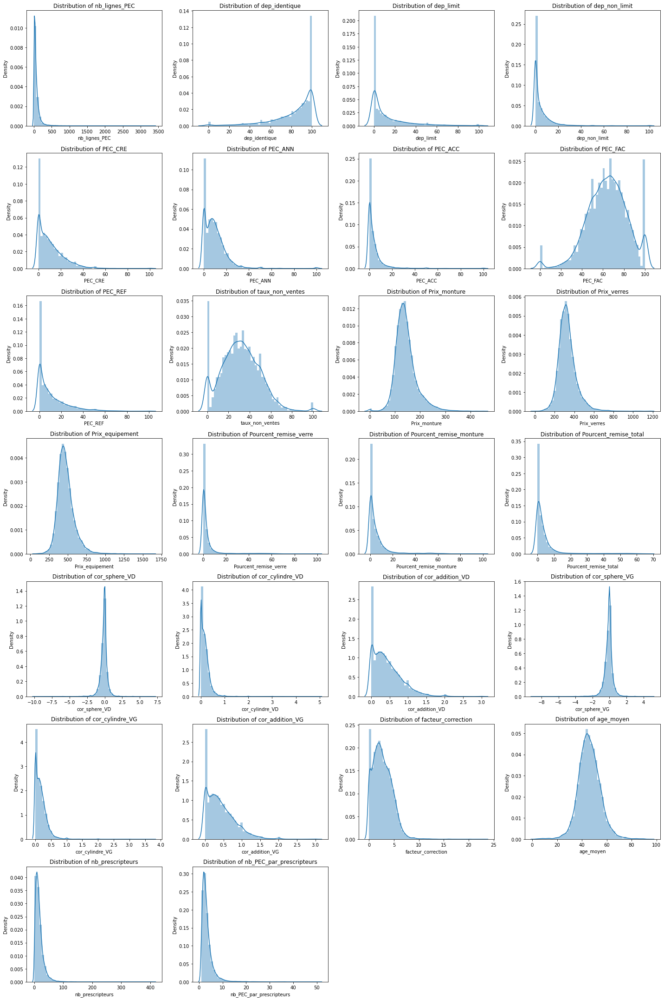

In [43]:
# visualize the data distribution 
plt.figure(figsize=(20, 30))

for i in range(len(num_cols)):
    plt.subplot(7, 4, i+1)
    # check_skew(df1, int_cols[i])
    plt.title('Distribution of ' + num_cols[i])
    sns.distplot(df2[num_cols[i]])
    # sns.histplot(df1[int_cols[i]], kde=True, bins=30)

plt.tight_layout()
plt.savefig('plots/data_distribution2.png', bbox_inches='tight')

#### Outliers - Violin plot

In [20]:
print(sorted(num_cols))
len(num_cols)

['PEC_ACC', 'PEC_ANN', 'PEC_CRE', 'PEC_FAC', 'PEC_REF', 'Pourcent_remise_monture', 'Pourcent_remise_total', 'Pourcent_remise_verre', 'Prix_equipement', 'Prix_monture', 'Prix_verres', 'age_moyen', 'cor_addition_VD', 'cor_addition_VG', 'cor_cylindre_VD', 'cor_cylindre_VG', 'cor_sphere_VD', 'cor_sphere_VG', 'dep_identique', 'dep_limit', 'dep_non_limit', 'facteur_correction', 'nb_PEC_par_prescripteurs', 'nb_lignes_PEC', 'nb_prescripteurs', 'taux_non_ventes']


26

{'age_moyen', 'facteur_correction', 'taux_non_ventes'}

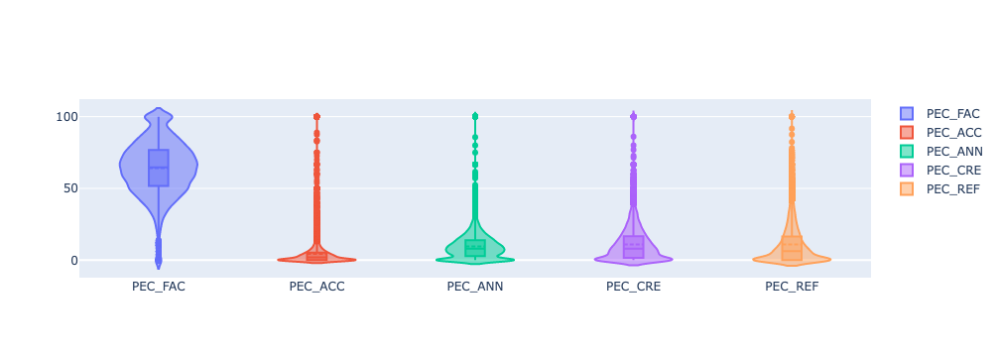

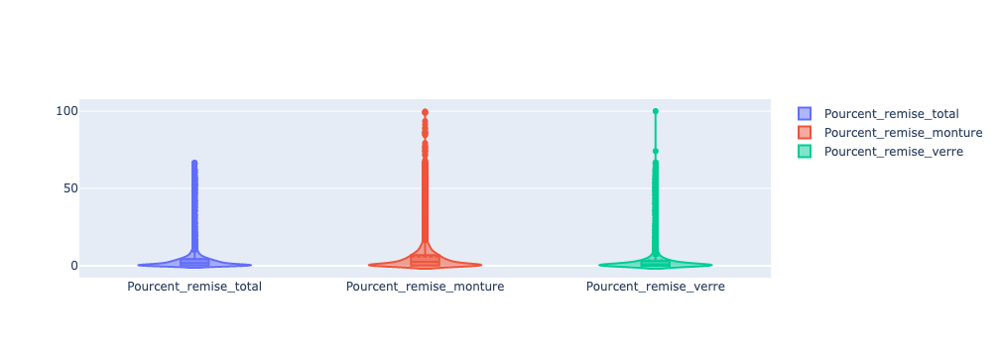

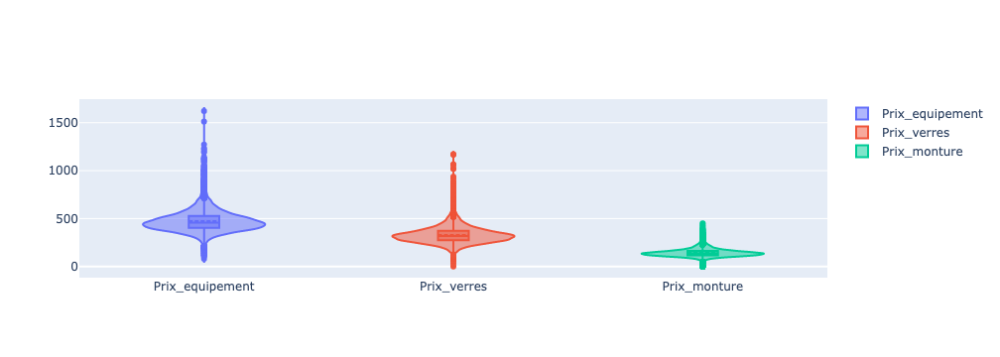

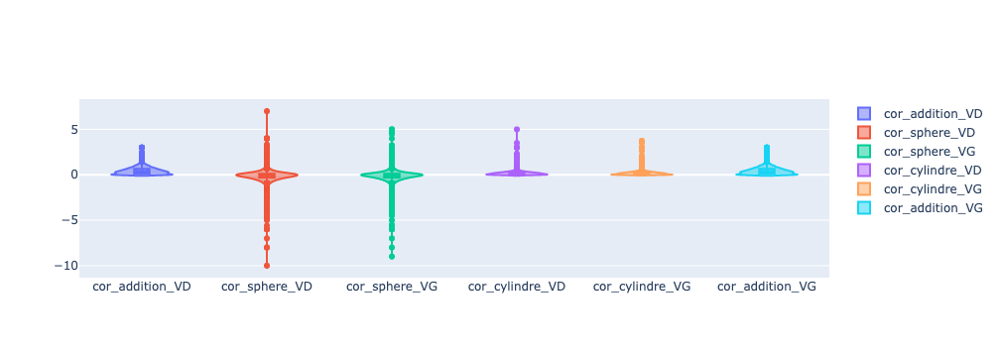

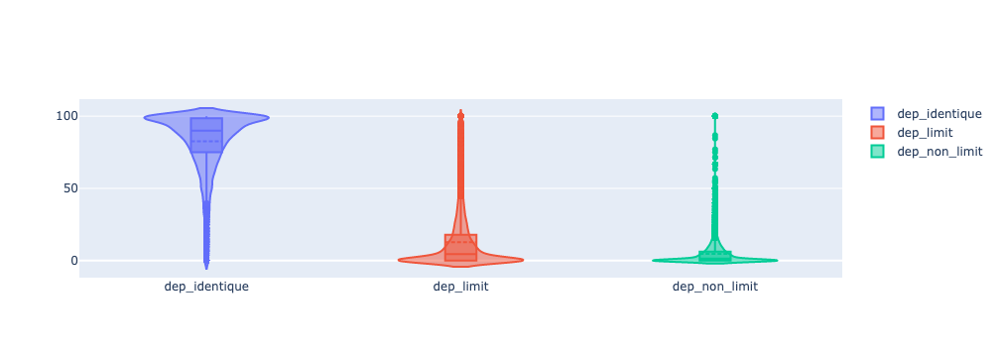

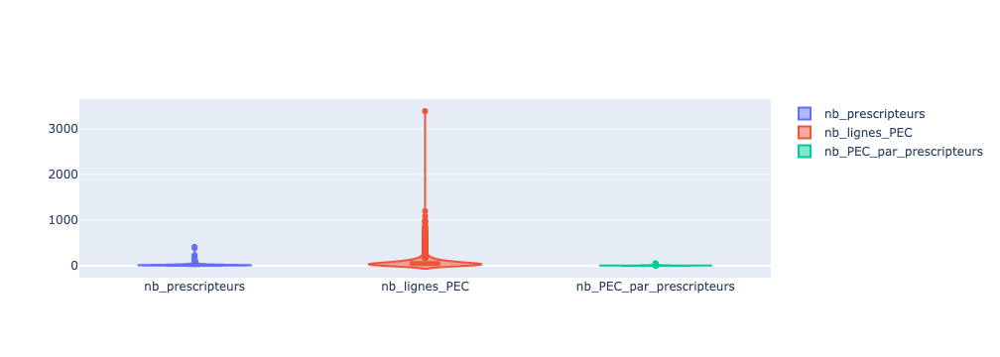

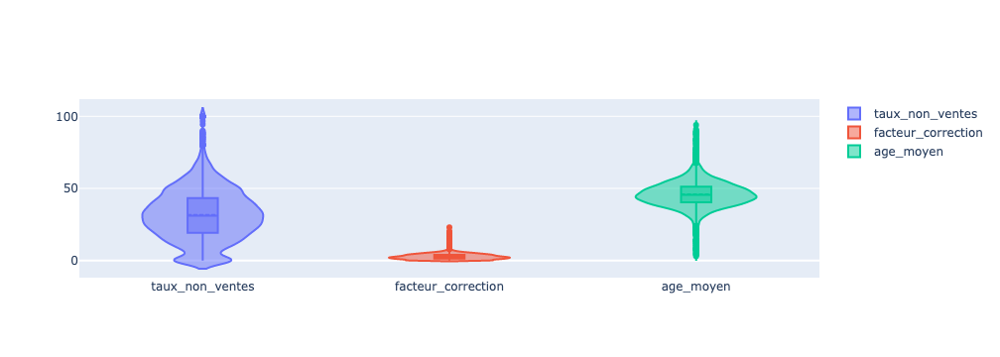

In [21]:
# group columns by prefix
PEC_cols = find_cols(num_cols,'PEC')
Pour_cols = find_cols(num_cols,'Pour')
Prix_cols = find_cols(num_cols,'Prix')
cor_cols = find_cols(num_cols,'cor')
# add_cols = find_cols(num_cols,'add')
# cylindre_cols = find_cols(num_cols,'cylindre')
dep_cols = find_cols(num_cols,'dep')
nb_cols = find_cols(num_cols,'nb')
# sphere_cols = find_cols(num_cols,'sphere')
other_cols = set(num_cols) - PEC_cols - Prix_cols - Pour_cols - cor_cols - dep_cols - nb_cols
other_cols


# show graphs in group
show_violin(df2, PEC_cols)
show_violin(df2, Pour_cols)
show_violin(df2, Prix_cols)
show_violin(df2, cor_cols)
# show_violin(cylindre_cols)
show_violin(df2, dep_cols)
show_violin(df2, nb_cols)
# show_violin(sphere_cols)
show_violin(df2, other_cols)


### 3. Bi-variate Data Analysis

#### Pair-plot

#### Heatmap

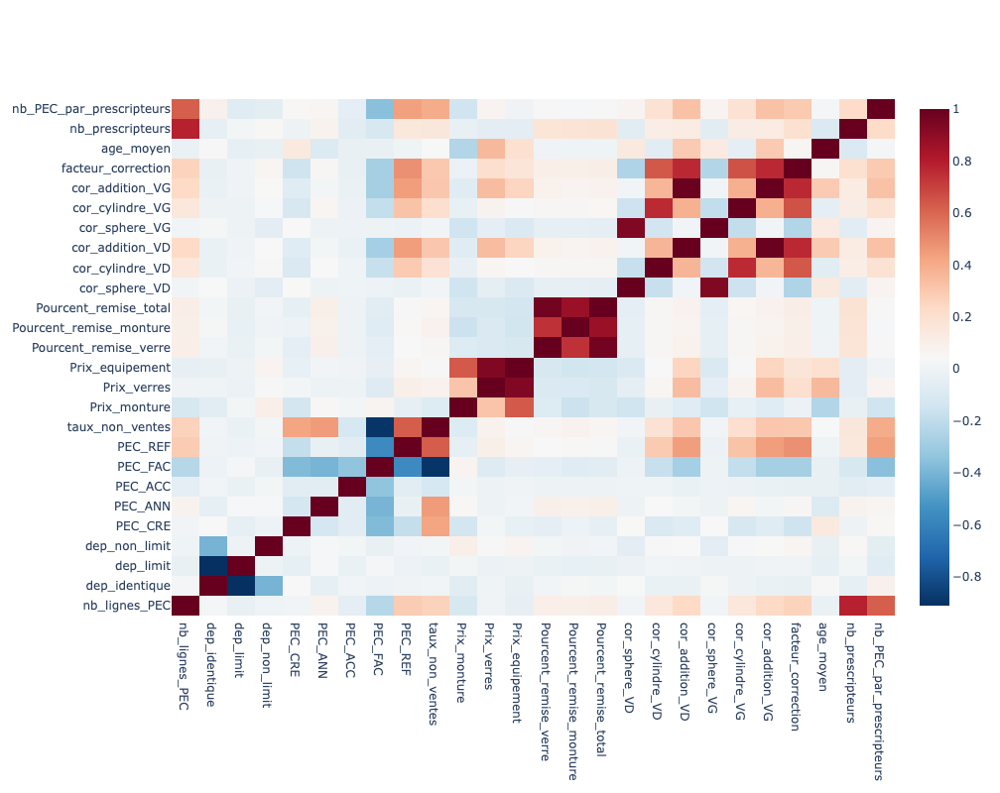

In [22]:
df_corr = df2[num_cols].corr()
fig_ = go.Figure(data=go.Heatmap(
                z=df_corr.round(3),
                x=num_cols,
                y=num_cols,
                colorscale = 'RdBu_r',
))

fig_.update_layout(
    autosize=False,
    width=1000,  # Set the width
    height=800,  # Set the height
)

# fig_.show()

## Dataset 3 - almerys_fraudulent_optician_id.csv

### 1. Data Overview

In [23]:
# target dataset
target = pd.read_csv('dataset/almerys_fraudulent_optician_id.csv')
target.shape
target.head()

(292, 1)

,ref_PS
0,dcdd15e23162877
1,bbe27a40e899143
2,8ac2cb18a35380f
3,c252448903abe48
4,dc0025ca591774f


In [24]:
target.nunique()

ref_PS    292
dtype: int64

### 2. Merged Analysis

In [25]:
# Merge the transaction data with the fraudulent optician IDs

labeled_df = df2.merge(target , how='left', left_on='ref_PS', right_on='ref_PS')

# Create a new column to flag the fraudulent transactions
labeled_df['is_fraud'] = [True if x in target['ref_PS'].tolist() else False for x in labeled_df['ref_PS'].tolist()]

# Display the first few rows of the merged dataset
labeled_df.head()

,ref_PS,nb_lignes_PEC,dep_identique,dep_limit,dep_non_limit,PEC_CRE,PEC_ANN,PEC_ACC,PEC_FAC,PEC_REF,...,cor_cylindre_VD,cor_addition_VD,cor_sphere_VG,cor_cylindre_VG,cor_addition_VG,facteur_correction,age_moyen,nb_prescripteurs,nb_PEC_par_prescripteurs,is_fraud
0,8c47fdd7c69650b,53,96.23,1.89,1.89,30.19,3.77,0.00,62.26,3.77,...,0.056604,0.226415,-0.301887,0.056604,0.226415,1.056604,45.396226,24,2.21,False
1,89bf4429f3ebda1,31,100.00,0.00,0.00,19.35,22.58,0.00,51.61,6.45,...,0.000000,0.129032,0.000000,0.096774,0.193548,0.548387,49.096774,11,2.82,False
2,5076215e2ee1797,22,95.45,4.55,0.00,4.55,13.64,13.64,68.18,0.00,...,0.318182,0.181818,-0.272727,0.227273,0.181818,2.318182,34.863636,11,2.00,False
3,3a771e3f5cbc3b2,41,97.56,0.00,2.44,12.20,0.00,4.88,82.93,0.00,...,0.000000,0.048780,0.000000,0.000000,0.048780,0.365854,31.829268,8,5.12,True
4,ced6f62ac55fd34,4,50.00,0.00,50.00,0.00,25.00,0.00,75.00,0.00,...,0.000000,0.000000,-0.500000,0.000000,0.000000,1.000000,43.750000,3,1.33,False


#### Distribution: Severely imbalanced

In [54]:
!pip install psutil


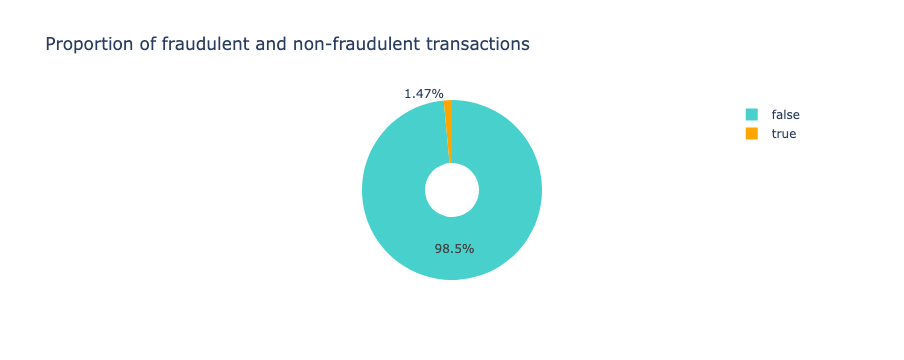

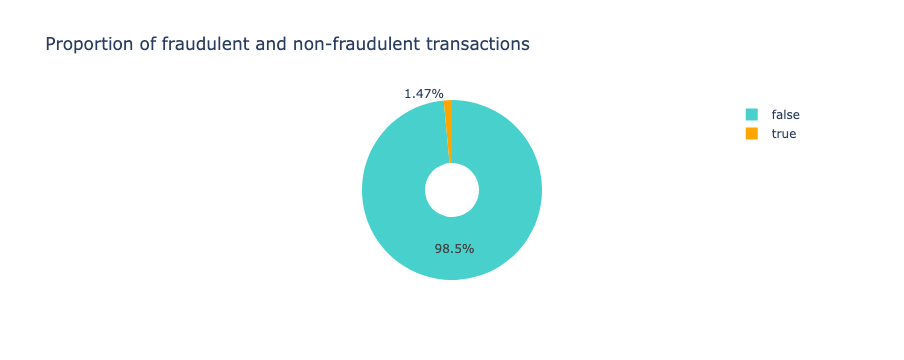

In [70]:
# Plot the distribution of fraudulent and non-fraudulent transactions

counts = labeled_df['is_fraud'].value_counts()
colors = ['mediumturquoise', 'orange'] # 'mediumturquoise', 
fig = go.Figure(data=[go.Pie(labels=counts.index, 
                             values=counts.values, 
                             hole=.3,
                             marker=dict(colors=colors))])
fig.update_layout(title_text="Proportion of fraudulent and non-fraudulent transactions",
                 paper_bgcolor='rgba(0,0,0,0)', # transparent background for the whole figure
    plot_bgcolor='rgba(0,0,0,0)'  # transparent background for the plot area
)
fig.write_image("plots/proportion.png")
fig.show()

<Figure size 1440x2160 with 0 Axes>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of nb_lignes_PEC')

<AxesSubplot:title={'center':'Distribution of nb_lignes_PEC'}, xlabel='nb_lignes_PEC', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of dep_identique')

<AxesSubplot:title={'center':'Distribution of dep_identique'}, xlabel='dep_identique', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of dep_limit')

<AxesSubplot:title={'center':'Distribution of dep_limit'}, xlabel='dep_limit', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of dep_non_limit')

<AxesSubplot:title={'center':'Distribution of dep_non_limit'}, xlabel='dep_non_limit', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of PEC_CRE')

<AxesSubplot:title={'center':'Distribution of PEC_CRE'}, xlabel='PEC_CRE', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of PEC_ANN')

<AxesSubplot:title={'center':'Distribution of PEC_ANN'}, xlabel='PEC_ANN', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of PEC_ACC')

<AxesSubplot:title={'center':'Distribution of PEC_ACC'}, xlabel='PEC_ACC', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of PEC_FAC')

<AxesSubplot:title={'center':'Distribution of PEC_FAC'}, xlabel='PEC_FAC', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of PEC_REF')

<AxesSubplot:title={'center':'Distribution of PEC_REF'}, xlabel='PEC_REF', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of taux_non_ventes')

<AxesSubplot:title={'center':'Distribution of taux_non_ventes'}, xlabel='taux_non_ventes', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Prix_monture')

<AxesSubplot:title={'center':'Distribution of Prix_monture'}, xlabel='Prix_monture', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Prix_verres')

<AxesSubplot:title={'center':'Distribution of Prix_verres'}, xlabel='Prix_verres', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Prix_equipement')

<AxesSubplot:title={'center':'Distribution of Prix_equipement'}, xlabel='Prix_equipement', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Pourcent_remise_verre')

<AxesSubplot:title={'center':'Distribution of Pourcent_remise_verre'}, xlabel='Pourcent_remise_verre', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Pourcent_remise_monture')

<AxesSubplot:title={'center':'Distribution of Pourcent_remise_monture'}, xlabel='Pourcent_remise_monture', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of Pourcent_remise_total')

<AxesSubplot:title={'center':'Distribution of Pourcent_remise_total'}, xlabel='Pourcent_remise_total', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of cor_sphere_VD')

<AxesSubplot:title={'center':'Distribution of cor_sphere_VD'}, xlabel='cor_sphere_VD', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of cor_cylindre_VD')

<AxesSubplot:title={'center':'Distribution of cor_cylindre_VD'}, xlabel='cor_cylindre_VD', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of cor_addition_VD')

<AxesSubplot:title={'center':'Distribution of cor_addition_VD'}, xlabel='cor_addition_VD', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of cor_sphere_VG')

<AxesSubplot:title={'center':'Distribution of cor_sphere_VG'}, xlabel='cor_sphere_VG', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of cor_cylindre_VG')

<AxesSubplot:title={'center':'Distribution of cor_cylindre_VG'}, xlabel='cor_cylindre_VG', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of cor_addition_VG')

<AxesSubplot:title={'center':'Distribution of cor_addition_VG'}, xlabel='cor_addition_VG', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of facteur_correction')

<AxesSubplot:title={'center':'Distribution of facteur_correction'}, xlabel='facteur_correction', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of age_moyen')

<AxesSubplot:title={'center':'Distribution of age_moyen'}, xlabel='age_moyen', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of nb_prescripteurs')

<AxesSubplot:title={'center':'Distribution of nb_prescripteurs'}, xlabel='nb_prescripteurs', ylabel='Count'>

<AxesSubplot:>

Text(0.5, 1.0, 'Distribution of nb_PEC_par_prescripteurs')

<AxesSubplot:title={'center':'Distribution of nb_PEC_par_prescripteurs'}, xlabel='nb_PEC_par_prescripteurs', ylabel='Count'>

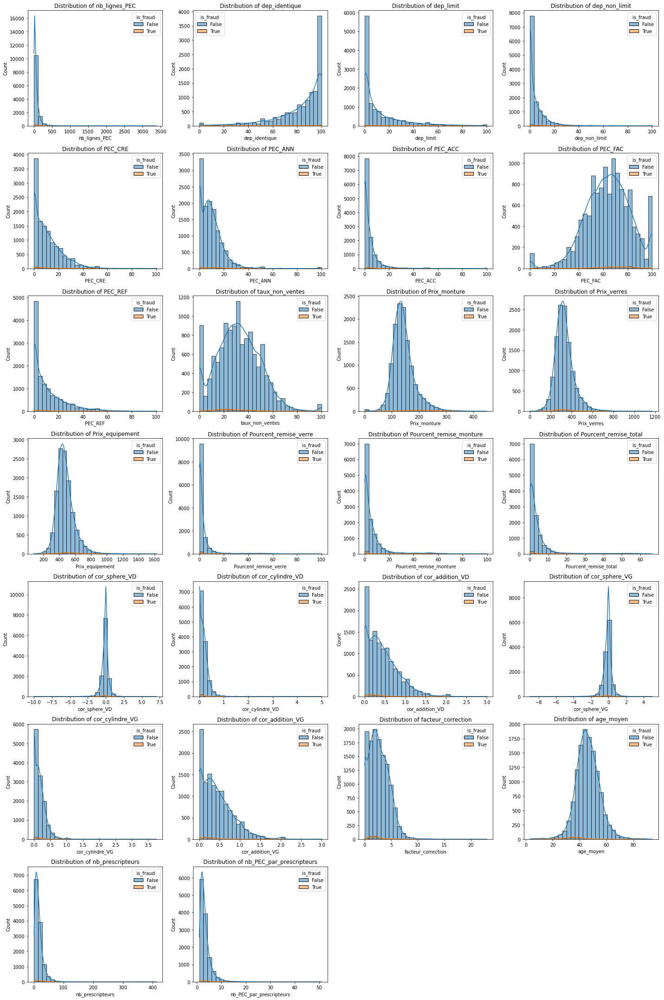

In [52]:
# Compare the distributions of numerical features for fraudulent and non-fraudulent transactions
# for feature in numerical_features:
#     plt.figure(figsize=(6, 4))
#     sns.histplot(data=fraudulent_transactions, x=feature, hue='is_fraud', kde=True, bins=30)
#     plt.title(f'Distribution of {feature} for Fraudulent and Non-Fraudulent Transactions')
#     plt.show()
    
# visualize the data distribution 
plt.figure(figsize=(20, 30))

for i in range(len(num_cols)):
    plt.subplot(7, 4, i+1)
    plt.title('Distribution of ' + num_cols[i])
    # Add a small amount of random noise to the data
    # jittered_data = labeled_df[num_cols[i]] + np.random.normal(0, 0.01, size=len(labeled_df))
    
    sns.histplot(data=labeled_df, x=num_cols[i], hue=labeled_df['is_fraud'], kde = True, bins=30)
    # sns.histplot(df1[int_cols[i]], kde=True, bins=30)

plt.tight_layout()
# plt.show()
plt.savefig('plots/data_distribution3.png')

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='nb_lignes_PEC', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of nb_lignes_PEC for Fraudulent and Non-Fraudulent Transactions')

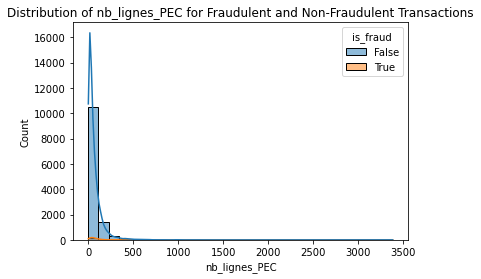

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='dep_identique', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of dep_identique for Fraudulent and Non-Fraudulent Transactions')

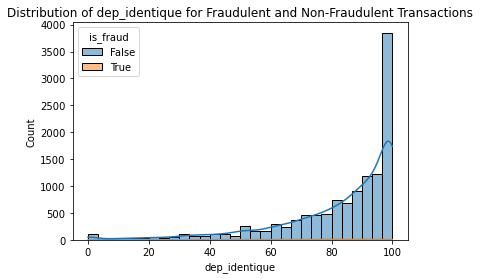

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='dep_limit', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of dep_limit for Fraudulent and Non-Fraudulent Transactions')

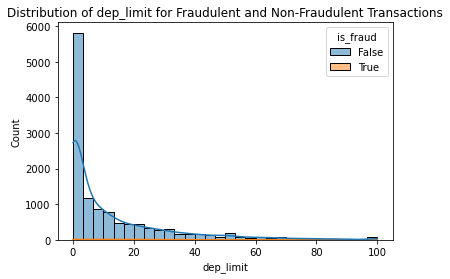

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='dep_non_limit', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of dep_non_limit for Fraudulent and Non-Fraudulent Transactions')

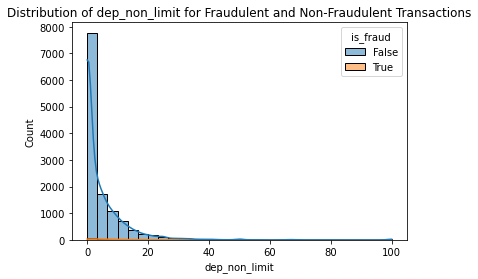

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='PEC_CRE', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of PEC_CRE for Fraudulent and Non-Fraudulent Transactions')

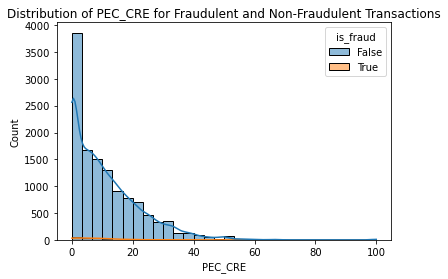

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='PEC_ANN', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of PEC_ANN for Fraudulent and Non-Fraudulent Transactions')

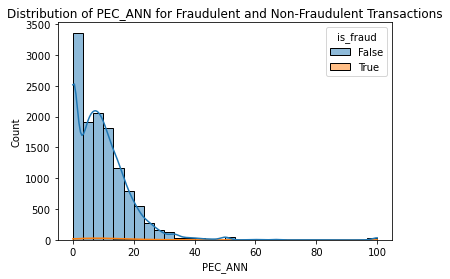

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='PEC_ACC', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of PEC_ACC for Fraudulent and Non-Fraudulent Transactions')

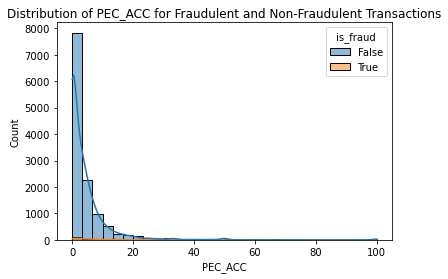

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='PEC_FAC', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of PEC_FAC for Fraudulent and Non-Fraudulent Transactions')

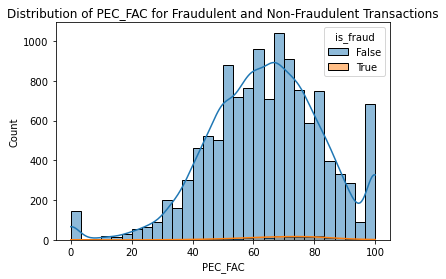

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='PEC_REF', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of PEC_REF for Fraudulent and Non-Fraudulent Transactions')

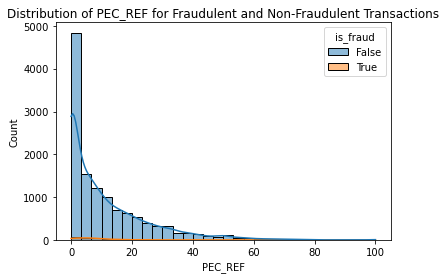

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='taux_non_ventes', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of taux_non_ventes for Fraudulent and Non-Fraudulent Transactions')

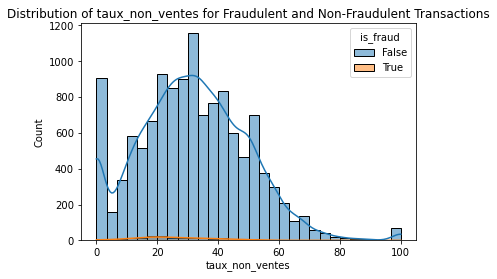

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='Prix_monture', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Prix_monture for Fraudulent and Non-Fraudulent Transactions')

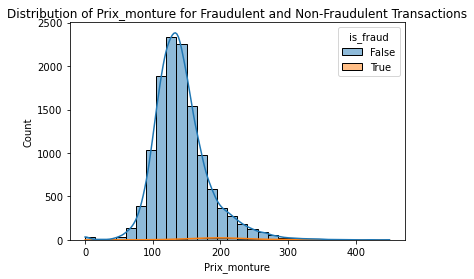

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='Prix_verres', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Prix_verres for Fraudulent and Non-Fraudulent Transactions')

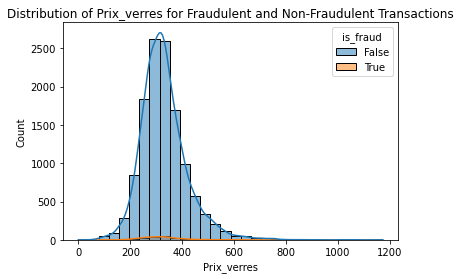

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='Prix_equipement', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Prix_equipement for Fraudulent and Non-Fraudulent Transactions')

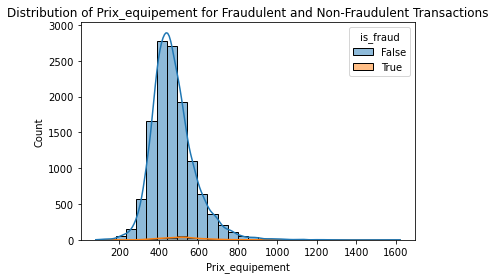

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='Pourcent_remise_verre', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Pourcent_remise_verre for Fraudulent and Non-Fraudulent Transactions')

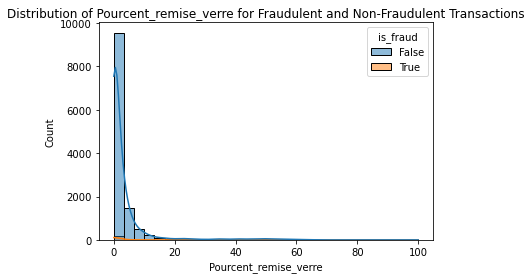

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='Pourcent_remise_monture', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Pourcent_remise_monture for Fraudulent and Non-Fraudulent Transactions')

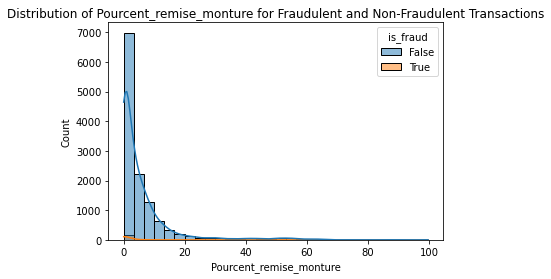

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='Pourcent_remise_total', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Pourcent_remise_total for Fraudulent and Non-Fraudulent Transactions')

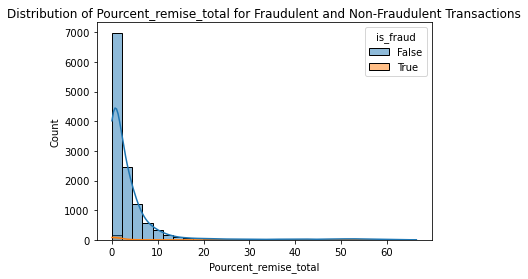

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='cor_sphere_VD', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of cor_sphere_VD for Fraudulent and Non-Fraudulent Transactions')

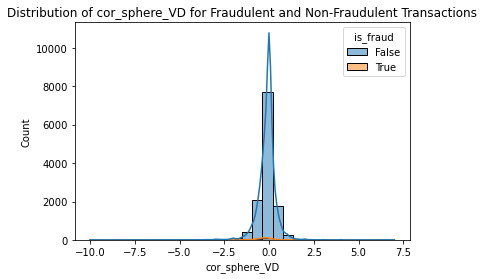

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='cor_cylindre_VD', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of cor_cylindre_VD for Fraudulent and Non-Fraudulent Transactions')

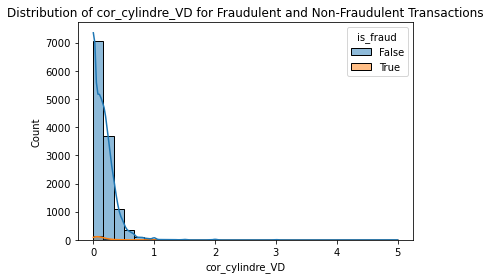

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='cor_addition_VD', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of cor_addition_VD for Fraudulent and Non-Fraudulent Transactions')

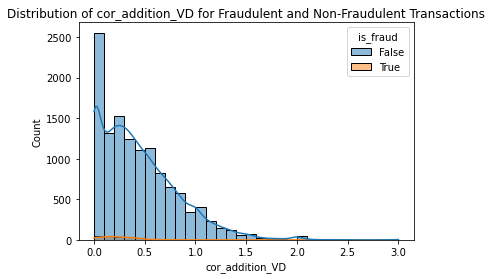

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='cor_sphere_VG', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of cor_sphere_VG for Fraudulent and Non-Fraudulent Transactions')

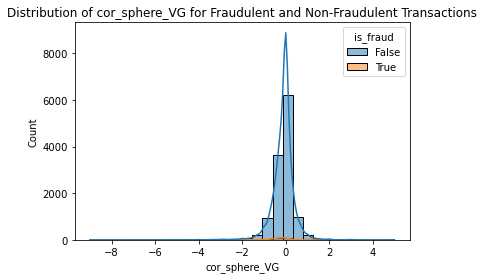

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='cor_cylindre_VG', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of cor_cylindre_VG for Fraudulent and Non-Fraudulent Transactions')

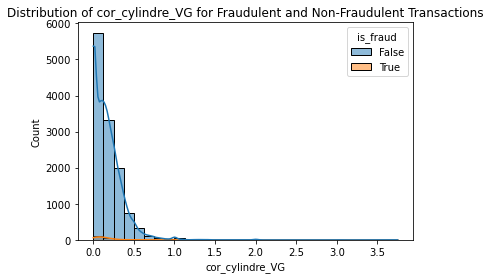

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='cor_addition_VG', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of cor_addition_VG for Fraudulent and Non-Fraudulent Transactions')

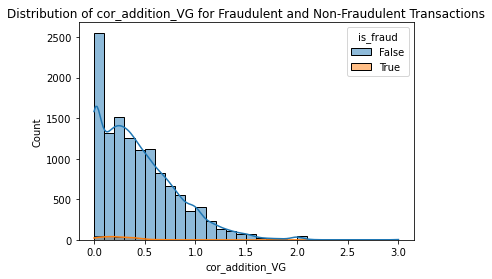

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='facteur_correction', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of facteur_correction for Fraudulent and Non-Fraudulent Transactions')

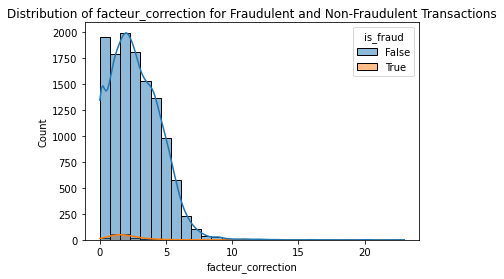

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='age_moyen', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of age_moyen for Fraudulent and Non-Fraudulent Transactions')

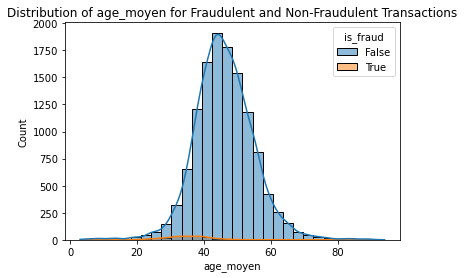

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='nb_prescripteurs', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of nb_prescripteurs for Fraudulent and Non-Fraudulent Transactions')

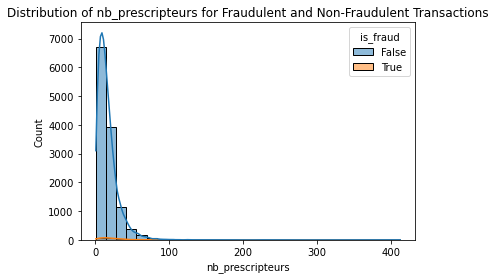

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='nb_PEC_par_prescripteurs', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of nb_PEC_par_prescripteurs for Fraudulent and Non-Fraudulent Transactions')

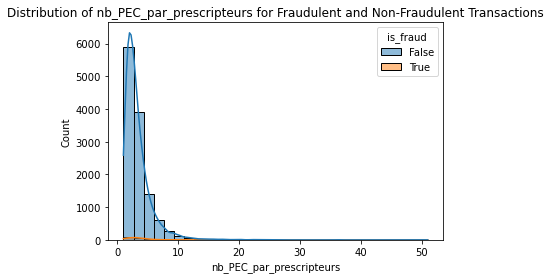

In [28]:
# Compare the distributions of numerical features for fraudulent and non-fraudulent transactions
for feature in num_cols:
    plt.figure(figsize=(6, 4))
    sns.histplot(data=labeled_df, x=feature, hue='is_fraud', kde=True, bins=30)
    plt.title(f'Distribution of {feature} for Fraudulent and Non-Fraudulent Transactions')
    plt.show()

In [45]:
num_cols

Index(['nb_lignes_PEC', 'dep_identique', 'dep_limit', 'dep_non_limit',
       'PEC_CRE', 'PEC_ANN', 'PEC_ACC', 'PEC_FAC', 'PEC_REF',
       'taux_non_ventes', 'Prix_monture', 'Prix_verres', 'Prix_equipement',
       'Pourcent_remise_verre', 'Pourcent_remise_monture',
       'Pourcent_remise_total', 'cor_sphere_VD', 'cor_cylindre_VD',
       'cor_addition_VD', 'cor_sphere_VG', 'cor_cylindre_VG',
       'cor_addition_VG', 'facteur_correction', 'age_moyen',
       'nb_prescripteurs', 'nb_PEC_par_prescripteurs'],
      dtype='object')

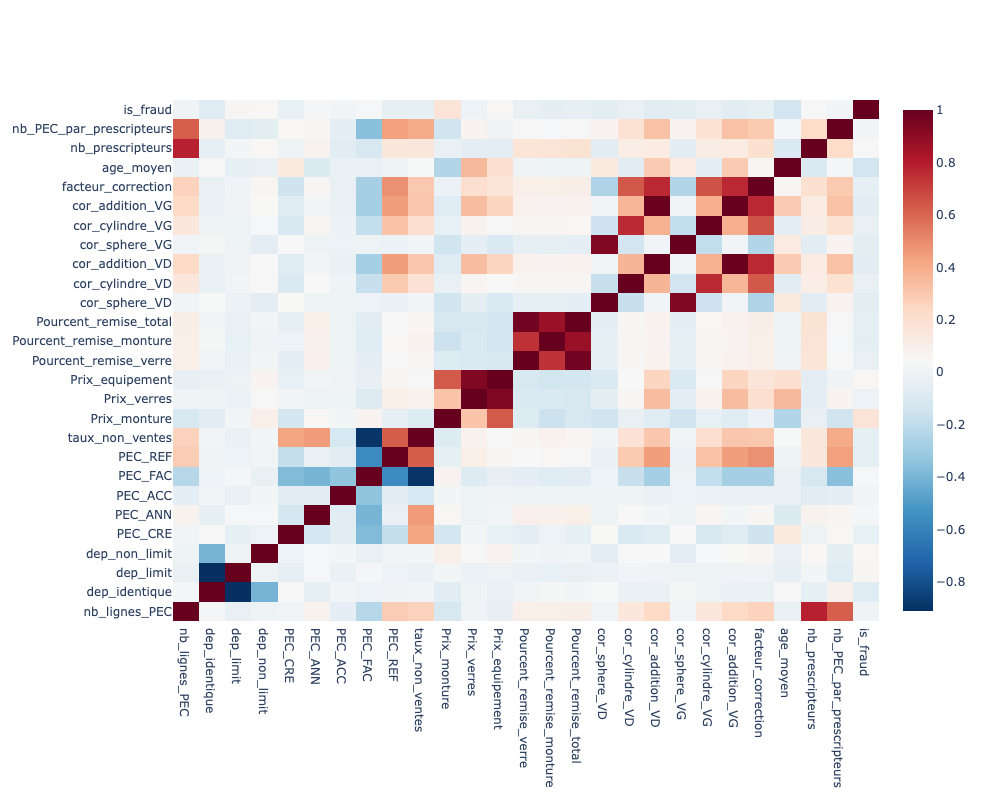

In [46]:


df_corr = labeled_df[num_cols].corr()
fig_ = go.Figure(data=go.Heatmap(
                z=df_corr.round(3),
                x=num_cols,
                y=num_cols,
                colorscale = 'RdBu_r',
))

fig_.update_layout(
    autosize=False,
    width=1000,  # Set the width
    height=800,  # Set the height
)



<Figure size 1440x1440 with 0 Axes>

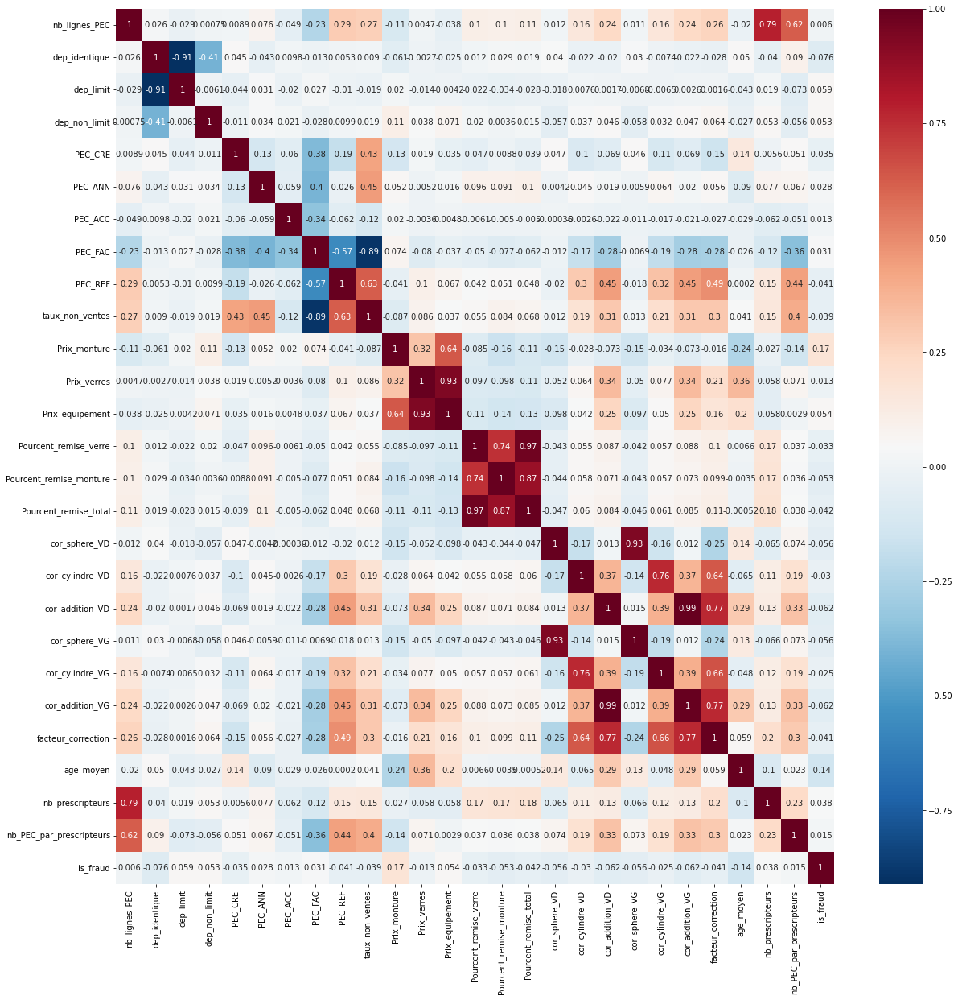

In [69]:
import seaborn as sns
from matplotlib import pyplot as plt

#get correlations of each features in dataset
corrmat = labeled_df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20, 20))
#plot heat map
g=sns.heatmap(labeled_df[top_corr_features].corr(), annot=True, cmap="RdBu_r")
g.get_figure().savefig('plots/heatmap3.png', bbox_inches='tight')